# TP de IMA201 : segmentation des images

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
import skimage as sk
from scipy import ndimage
from scipy import signal
from skimage import io
from skimage import filters
import mrlab as mr
import time
plt.close('all')

C:\Users\DELL\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
import tempfile
import IPython

def viewimage(im, normalize=True,titre='',displayfilename=False):
    imin=im.copy().astype(np.float32)
    if normalize:
        imin-=imin.min()
        if imin.max()>0:
            imin/=imin.max()
    else:
        imin=imin.clip(0,255)/255
        
    
    imin=(imin*255).astype(np.uint8)
    filename=tempfile.mktemp(titre+'.png')
    print(titre)
    if displayfilename:
        print (filename)
    plt.imsave(filename, imin, cmap='gray')
    IPython.display.display(IPython.display.Image(filename))

## 1 Détection de contours
### 1.1 Filtre de gradient local par masque

Image originale


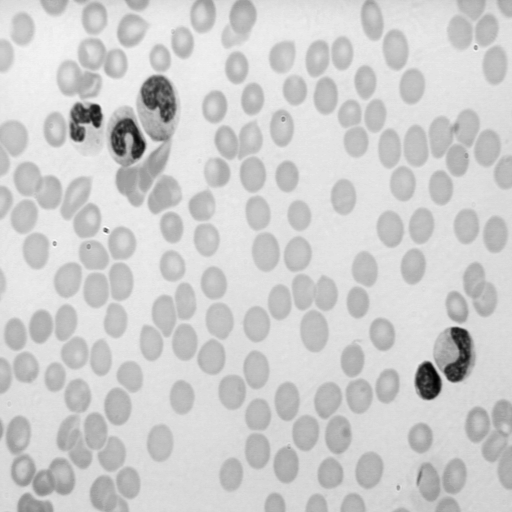

Image filtrée (passe-bas)


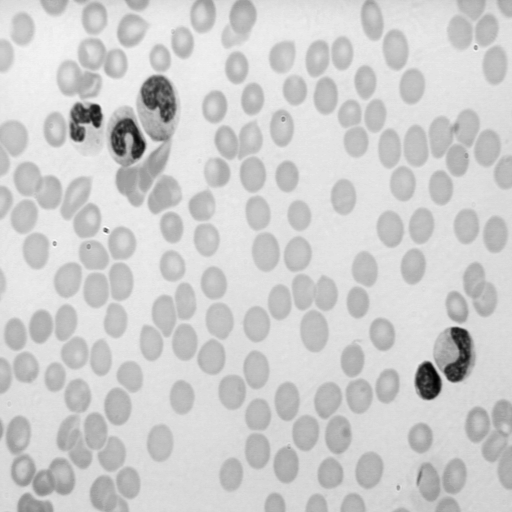

In [3]:
ima=io.imread('images/cell.tif')
sigma=0
gfima=filters.gaussian(ima,sigma)
viewimage(ima, normalize=True,titre='Image originale')
viewimage(gfima, normalize=True,titre='Image filtrée (passe-bas)')

Gradient horizontal


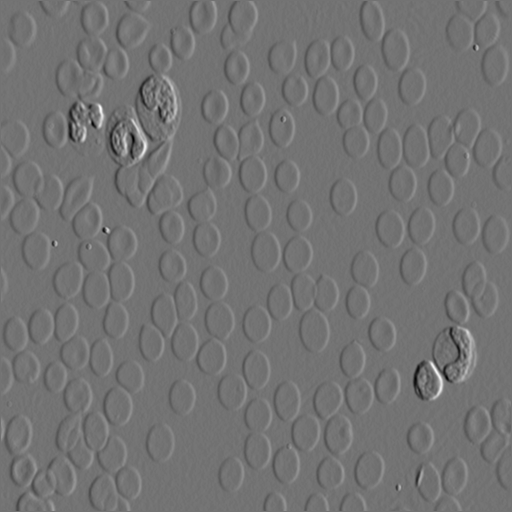

Gradient vertical


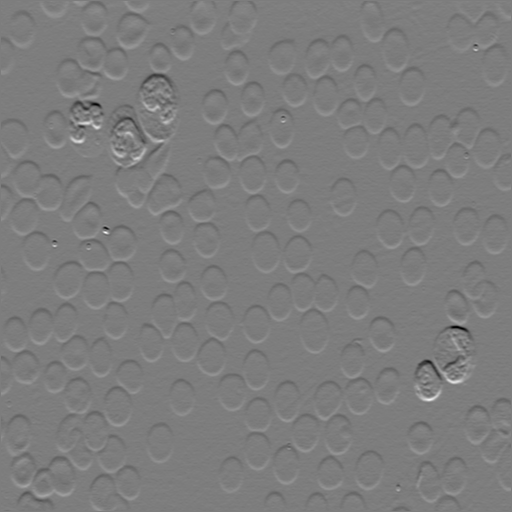

In [4]:
gradx=mr.sobelGradX(gfima)
grady=mr.sobelGradY(gfima)  
viewimage(gradx, normalize=True,titre='Gradient horizontal')      
viewimage(grady, normalize=True,titre='Gradient vertical')

Norme du gradient


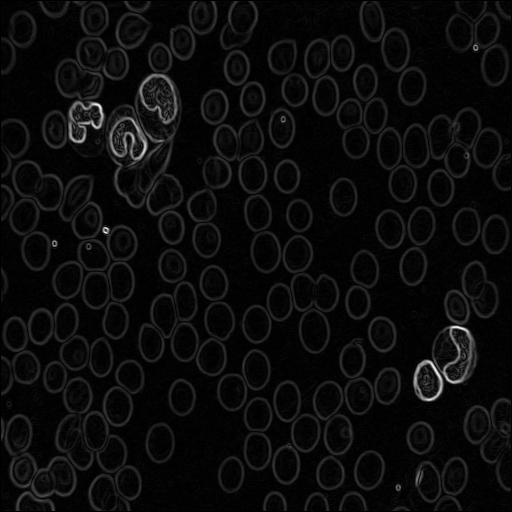

Direction du Gradient


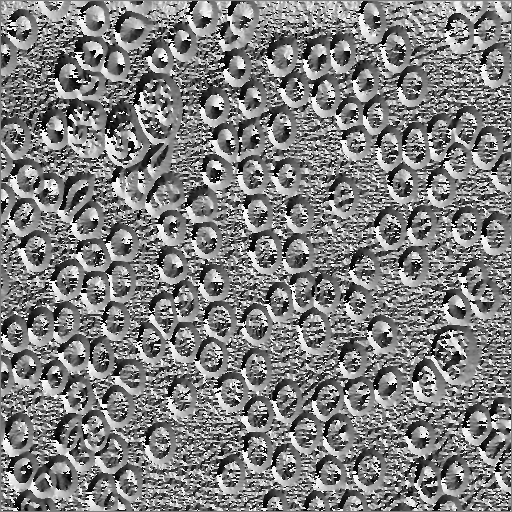

In [5]:
norme=np.sqrt(gradx*gradx+grady*grady)
    
viewimage(norme, normalize=True,titre='Norme du gradient')
direction=np.arctan2(grady,gradx)
viewimage(direction, normalize=True,titre='Direction du Gradient')   

Norme seuillée


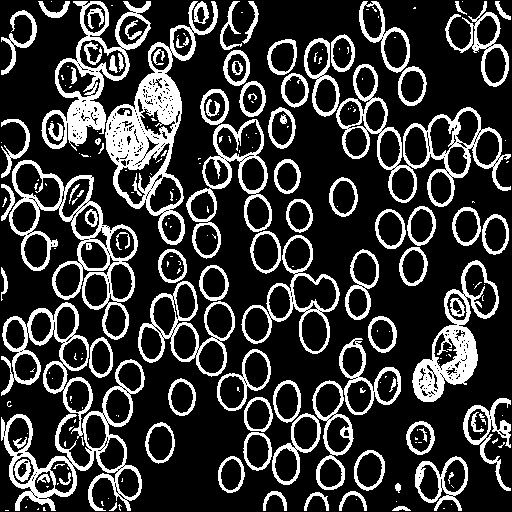

Norme seuillée


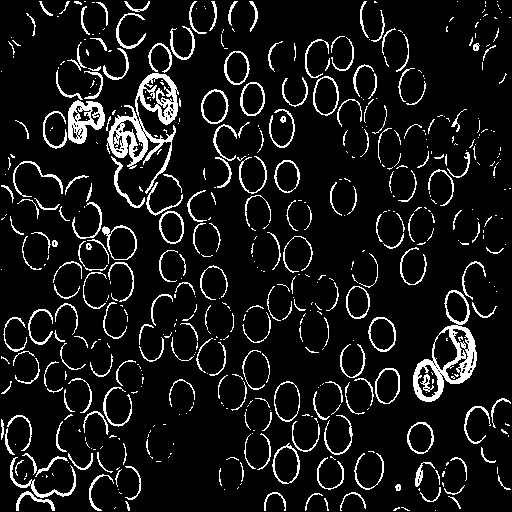

Norme seuillée


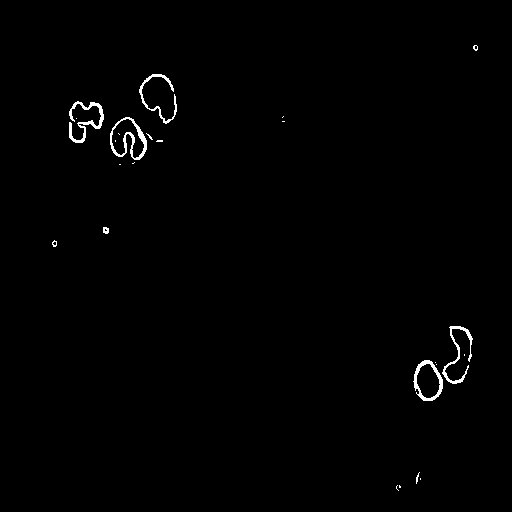

In [6]:
seuilnormes= [0.1, 0.2, 0.5]
for seuilnorme in seuilnormes:
    contoursnorme =(norme>seuilnorme) 
    viewimage(255*contoursnorme, normalize=True,titre='Norme seuillée')


Rappelez l’intérêt du filtre de Sobel, par rapport au filtre différence, qui calcule une dérivée par la simple différence entre deux pixels voisins

***Le filtre de Sobel est plus adapté à la détection précise des contours dans les images grâce à ses noyaux de convolution spécifiques conçus pour mettre en évidence les contours horizontaux et verticaux. Il offre une meilleure sensibilité aux contours nets et réduit le bruit grâce à un léger lissage local. En revanche, le filtre de différence, qui se contente de calculer la différence d'intensité entre les pixels voisins, est moins sensible aux contours subtils et peut amplifier le bruit.***

Est-il nécessaire de réaliser un filtre passe-bas sur l'image avant d'utiliser le filtre de Sobel ?

***L'utilisation d'un filtre passe-bas sur l'image avant d'appliquer le filtre de Sobel n'est pas strictement nécessaire, mais cela peut être une étape préliminaire bénéfique dans certains cas. Un filtre passe-bas peut aider à réduire le bruit et les détails indésirables dans l'image, ce qui peut améliorer la performance du filtre de Sobel en mettant davantage l'accent sur les contours significatifs. Cependant, la nécessité d'une étape de filtrage passe-bas dépendra de la qualité de l'image d'origine et des objectifs de traitement d'image. Dans des situations où l'image est propre et ne contient pas beaucoup de bruit, il peut être possible d'appliquer directement le filtre de Sobel pour détecter les contours sans filtrage préalable.***

Le seuillage de la norme du gradient influence la qualité des contours obtenus en termes de robustesse au bruit, de continuité, d'épaisseur et de position. Commentez cette influence en fonction des variations du seuil.

***Le seuillage de la norme du gradient est une étape cruciale pour extraire des contours d'une image. Lorsque l'on ajuste ce seuil, plusieurs aspects de la qualité des contours obtenus sont impactés. Une valeur de seuil basse peut rendre la détection des contours plus sensible, mais en même temps, elle risque d'introduire du bruit dans les contours détectés, ce qui affecte leur robustesse. À l'inverse, un seuil élevé peut réduire le bruit, mais peut aussi conduire à la perte de certains contours fins. La continuité des contours dépendra de la manière dont le seuil est choisi, tandis que l'épaisseur et la position des contours seront également influencées par ce réglage.***


### 1.2 Maximum du gradient filtré dans la direction du gradient

Maxima du gradient dans la direction du gradient


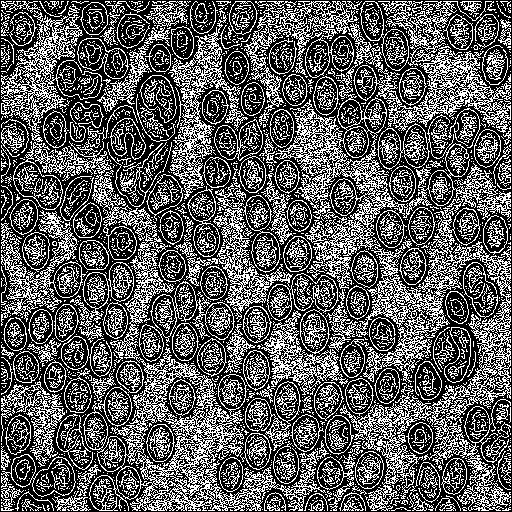

In [7]:
contours=np.uint8(mr.maximaDirectionGradient(gradx,grady))

viewimage(255*contours, normalize=True,titre='Maxima du gradient dans la direction du gradient')

Contours fin


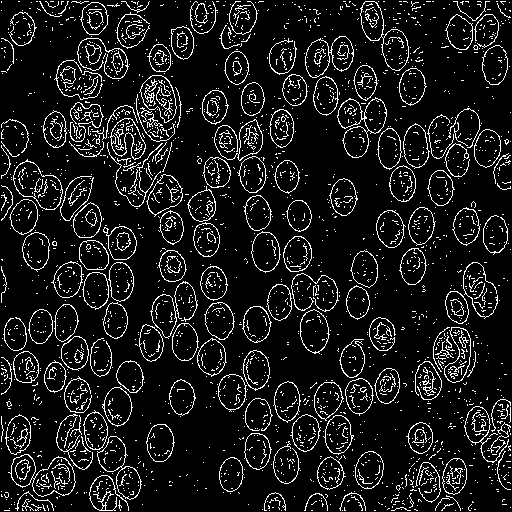

Contours fin


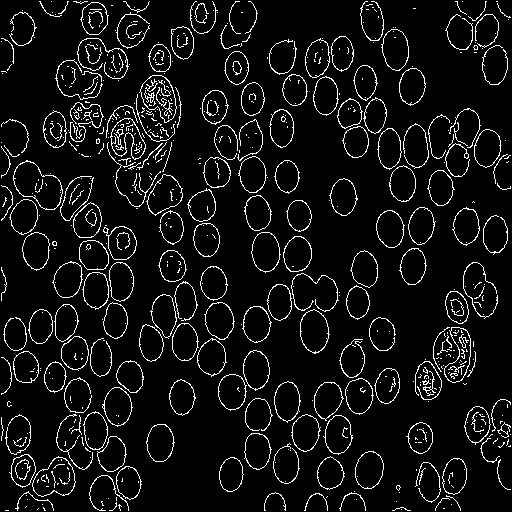

Contours fin


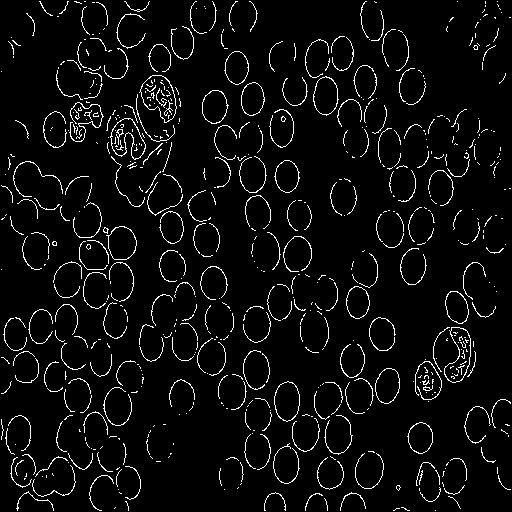

In [8]:
seuilnormes= [0.05, 0.1, 0.2]
for seuilnorme in seuilnormes:
    valcontours=(norme>seuilnorme)*contours
    viewimage(255*valcontours, normalize=True,titre='Contours fin')

La fonction maximaDirectionGradient permet de déterminer les pixels de l'image qui représentent des maxima du gradient dans la direction du gradient. Quel critère de qualité est optimisé par ce processus ?

***La fonction maximaDirectionGradient optimise la qualité des contours en trouvant les maxima du gradient dans la direction du gradient grâce à une interpolation linéaire entre la norme du gradient et le gradient local. Ceci permet la détection de points saillants le long des contours.***

Il est possible d'éliminer les contours dont la norme est inférieure à un seuil donné. Commentez les résultats obtenus en termes de position, de continuité des contours et de robustesse au bruit en ajustant ce seuil.

***On peut observer que la variation du seuil a un effet notable sur la qualité de la détection des contours. Un seuil élevé, par exemple, supérieur ou égal à 0.2, tend à entraîner la suppression de contours plus faibles, risquant de perdre des détails importants. En revanche, un seuil bas, par exemple, inférieur ou égal à 0.05, peut provoquer l'identification de contours indésirables, introduisant du bruit dans les résultats.***

Cherchez à fixer le seuil sur la norme de manière à obtenir un compromis entre la robustesse au bruit et la continuité des contours

***Un seuil de 0.1 semble offrir un compromis optimal en maintenant la continuité des contours tout en minimisant l'effet du bruit.***

### 1.3 Filtre récursif de Deriche


Dans le fichier mrlab.py, des erreurs ont été repérées dans les fonctions dericheGradX et dericheGradY. Votre mission est de corriger ces fonctions, uniquement au niveau des lignes spécifiées, pour les rendre récursives.

In [9]:
def dericheGradX(ima,alpha):

    
    nl,nc=ima.shape
    ae=math.exp(-alpha)
    c=-(1-ae)*(1-ae)/ae

    b1=np.zeros(nc)
    b2=np.zeros(nc)

    gradx=np.zeros((nl,nc))


#gradx=np.zeros(nl,nc)
    for i in range(nl):
        
        l=ima[i,:].copy()
        
        for j in range(2,nc):
            b1[j] = l[j-1] + 2*ae*b1[j-1] - ae*ae*b1[j-2] 
        b1[0]=b1[2]
        b1[1]=b1[2]
        
        for j in range(nc-3,-1,-1):
            b2[j] = l[j+1] + 2*ae*b2[j+1] - ae*ae*b2[j+2]
        b2[nc-2]=b2[nc-3]
        b2[nc-1]=b2[nc-3]

        gradx[i,:]=c*ae*(b1-b2);
  
    return gradx

def dericheGradY(ima,alpha):

    
    nl,nc=ima.shape
    ae=math.exp(-alpha)
    c=-(1-ae)*(1-ae)/ae

    b1=np.zeros(nl)
    b2=np.zeros(nl)

    grady=np.zeros((nl,nc))

    for i in range(nc):
        
        l=ima[:,i].copy()
        
        for j in range(2,nl):
            b1[j]=l[j-1] + 2*ae*b1[j-1] - ae*ae*b1[j-2] 
        b1[0]=b1[2]
        b1[1]=b1[2]      
        
        for j in range(nl-3,-1,-1):
            b2[j]=l[j+1]  + 2*ae*b2[j+1] - ae*ae*b2[j+2]
        b2[nl-1]=b2[nl-3]
        b2[nl-2]=b2[nl-3]
        
        grady[:,i]=c*ae*(b1-b2);
        
    
    return grady

Testez la détection de contours avec ce filtre sur plusieurs images. Décrit l'impact du paramètre α sur les résultats de la segmentation (variez ce paramètre dans l'intervalle de 0.3 à 3.0)

In [10]:
seuilnorme = 0.1
alphas = [0.3, 1, 3]

In [11]:
def deriche(im,alpha,seuilnorme):
    gradx=dericheGradX(im,alpha)
    grady=dericheGradY(im,alpha)
    norme=np.sqrt(gradx*gradx+grady*grady)
    contours=np.uint8(mr.maximaDirectionGradient(gradx,grady))
    valcontours=(norme>seuilnorme)*contours
    return valcontours

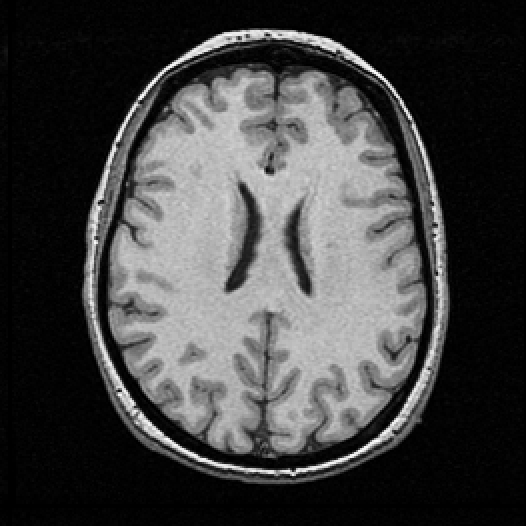

In [12]:
im_cer=io.imread('images/cerveau.tif')
viewimage(im_cer)

In [13]:
sigma=0
gfim_cer=filters.gaussian(im_cer,sigma)

alpha = 0.3


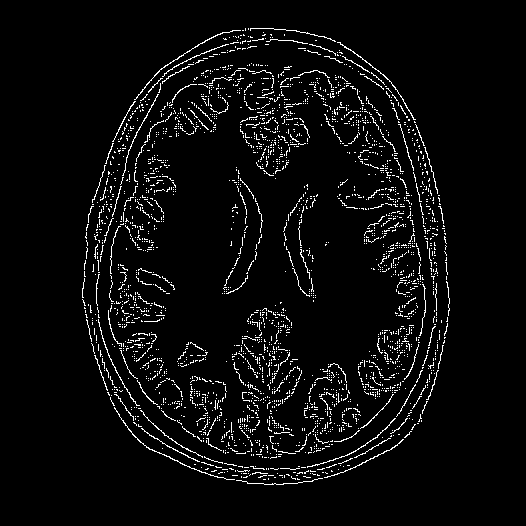

alpha = 1


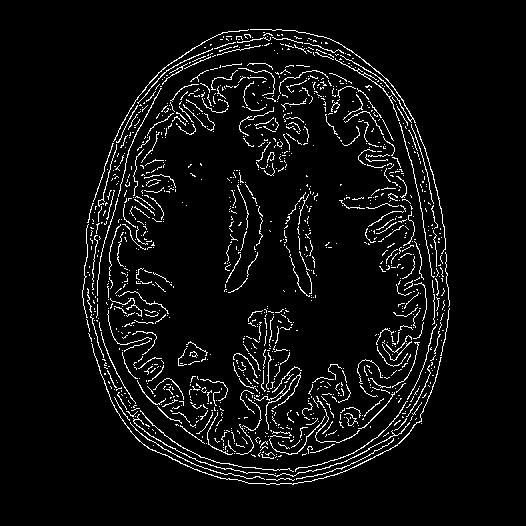

alpha = 3


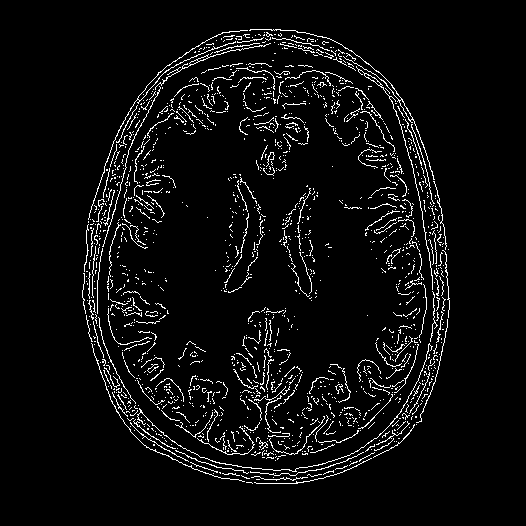

In [14]:
t = []
for alpha in alphas:
    t1 = time.time()
    valcontours_cer = deriche(gfim_cer,alpha,seuilnorme)
    t2 = time.time()
    t.append(t2 - t1)
    viewimage(255*valcontours_cer, normalize=True,titre='alpha = '+ str(alpha))

In [15]:
print(t)

[8.897334575653076, 8.123783826828003, 8.538704633712769]


alpha = 0.3


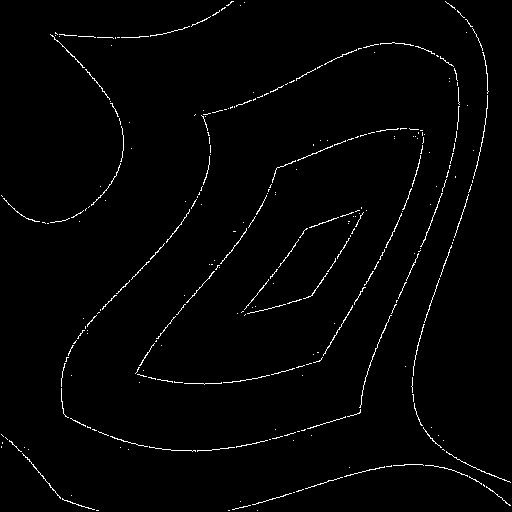

alpha = 1


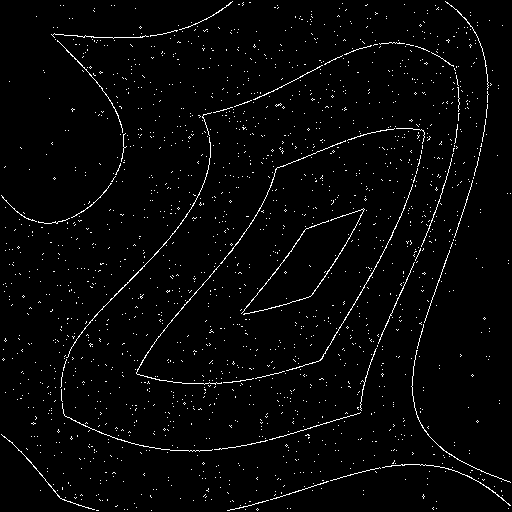

alpha = 3


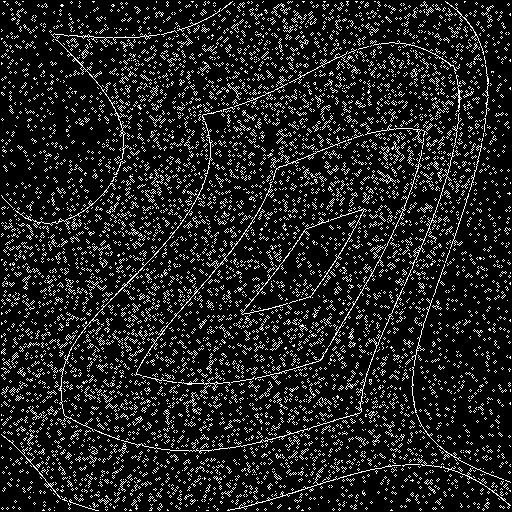

In [16]:
im_pyb=io.imread('images/pyrabruit.tif')
sigma=0
seuilnorme = 0.1
gfim_pyb=filters.gaussian(im_pyb,sigma)
alphas = [0.3, 1, 3]
for alpha in alphas:
    valcontours_pyb = deriche(gfim_pyb,alpha,seuilnorme)
    viewimage(255*valcontours_pyb, normalize=True,titre='alpha = '+ str(alpha))

***Lorsque nous augmentons la valeur d'α, nous devenons plus sensibles à la détection des contours, ce qui, malheureusement, nous rend également plus sensibles au bruit. À l'inverse, lorsque nous réduisons α, nous obtenons des contours avec des transitions plus douces.***

Le temps de calcul dépend-il de la valeur de α ? Expliquez pourquoi.

***Les variations d'α n'affectent pas la complexité de l'algorithme, qui reste en O(n^2), où n est le produit du nombre de lignes par le nombre de colonnes dans l'image. Cela est dû au fait que le calcul de l'exponentiel de moins α est réalisé en O(1) et ne dépend pas de la valeur spécifique d'α. En fin de compte, le comportement de l'algorithme de Deriche est similaire à l'effet de filtrage d'image obtenu avec le filtre de Sobel.***

Comment et dans quel but les fonctions dericheSmoothX et dericheSmoothY sont-elles utilisées?

In [17]:
def Smooth_deriche(im,alpha,seuilnorme):
    gradx=dericheGradX(mr.dericheSmoothY(im,alpha),alpha)
    grady=dericheGradY(mr.dericheSmoothX(im,alpha),alpha)  
    norme=np.sqrt(gradx*gradx+grady*grady)
    contours=np.uint8(mr.maximaDirectionGradient(gradx,grady))
    valcontours=(norme>seuilnorme)*contours
    return valcontours

alpha = 1, seuil = 0.1


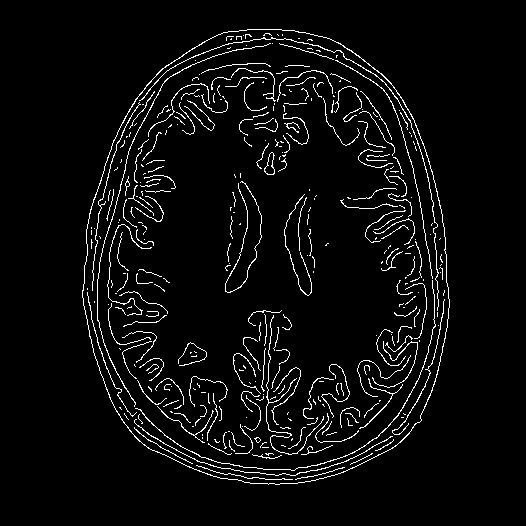

In [18]:
Svalcontours_cer = Smooth_deriche(gfim_cer,alpha = 1,seuilnorme = 0.1)
viewimage(255*Svalcontours_cer, normalize=True,titre='alpha = 1, seuil = 0.1')


alpha = 1, seuil = 0.1


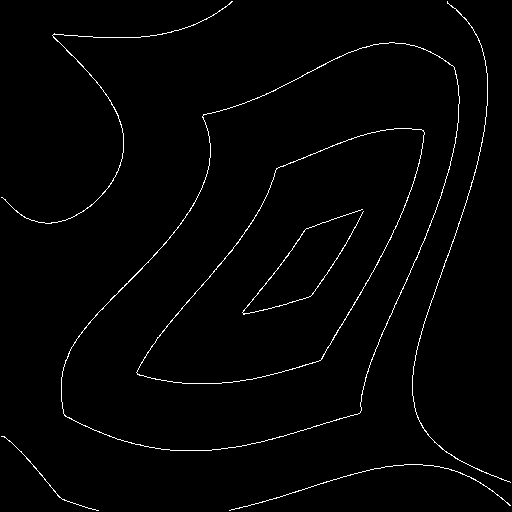

In [19]:
Svalcontours_pyb = Smooth_deriche(gfim_pyb,alpha = 1,seuilnorme = 0.1)
viewimage(255*Svalcontours_pyb, normalize=True,titre='alpha = 1, seuil = 0.1')

***l'algorithme de lissage de Deriche permet de réduire le bruit tout en préservant les contours d'une image. La valeur de alpha contrôle le compromis entre le lissage et la préservation des détails.***

### 1.4 Passage par zéro du laplacien
Testez la détection de contours par passage par zéro du laplacien avec la routine laplacien.py.

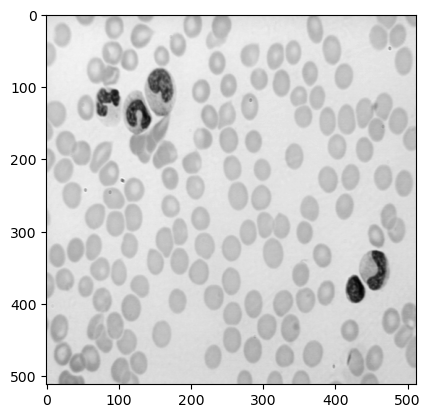

In [20]:
ima=io.imread('images/cell.tif')
plt.figure('Image originale')
plt.imshow(ima, cmap='gray')


In [21]:
def grad2(ima,alpha):
    gradx=dericheGradX(mr.dericheSmoothY(ima,alpha),alpha)
    grady=dericheGradY(mr.dericheSmoothX(ima,alpha),alpha)  

    gradx2=dericheGradX(mr.dericheSmoothY(gradx,alpha),alpha)
    grady2=dericheGradY(mr.dericheSmoothX(grady,alpha),alpha) 
    
    return gradx2+grady2

def f_contours(posneg,nl,nc):
    contours = np.uint8(np.zeros((nl,nc)))
    for i in range(1,nl):
        for j in range(1,nc):
            if (((i>0) and (posneg[i-1,j] != posneg[i,j])) or ((j>0) and (posneg[i,j-1] != posneg[i,j]))):
                contours[i,j]=255
    return contours

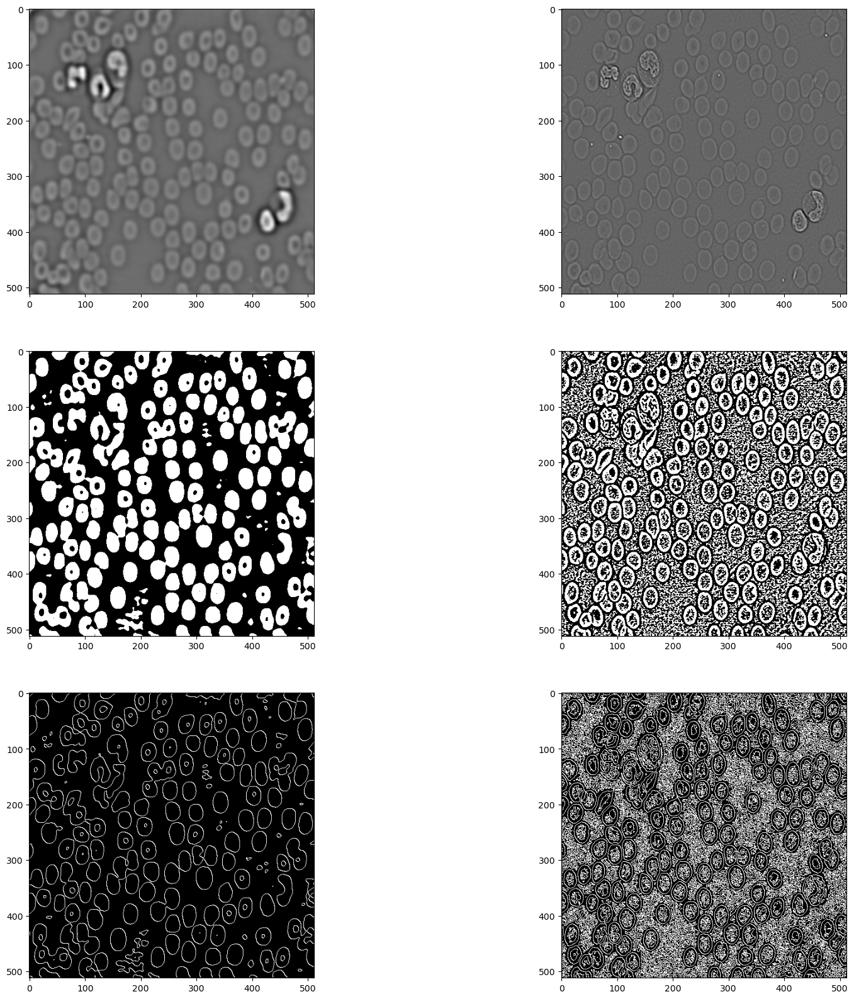

In [22]:
alpha1=0.5
alpha2= 3

lpima1=grad2(ima,alpha1)
lpima2=grad2(ima,alpha2)

fig, ax = plt.subplots(3,2,figsize=(20, 20))

ax[0][0].imshow(lpima1, cmap='gray')
ax[0][1].imshow(lpima2, cmap='gray')

posneg1=(lpima1>=0)
posneg2=(lpima2>=0)

ax[1][0].imshow(255*posneg1, cmap='gray')
ax[1][1].imshow(255*posneg2, cmap='gray')

nl,nc=ima.shape
contours1=f_contours(posneg1,nl,nc)
contours2=f_contours(posneg2,nl,nc)

ax[2][0].imshow(contours1, cmap='gray')
ax[2][1].imshow(contours2, cmap='gray')

***Lorsque nous effectuons la détection de contours en utilisant laplacien.py, nous observons un effet significatif du paramètre α sur les résultats. En augmentant α, nous constatons une augmentation des contours indésirables résultant du bruit. À l'inverse, en réduisant α, nous observons l'apparition de contours supplémentaires, qui peuvent prendre la forme de détails indésirables.
Plus particulièrement, lors de l'analyse de l'image "cell.tif", nous remarquons que le laplacien génère des contours fermés, tandis que les opérateurs précédemment utilisés, tels que les contours de Deriche, peuvent donner naissance à des lignes de contours ouverts. Cette distinction est essentielle, car les contours fermés sont souvent préférés dans certaines applications, tandis que les lignes ouvertes peuvent être plus appropriées dans d'autres cas.***

In [23]:
def laplacien(im,alpha):
    lpima=grad2(im,alpha)
    posneg=(lpima>=0)
    nl,nc=im.shape
    contours=f_contours(posneg,nl,nc)
    return contours

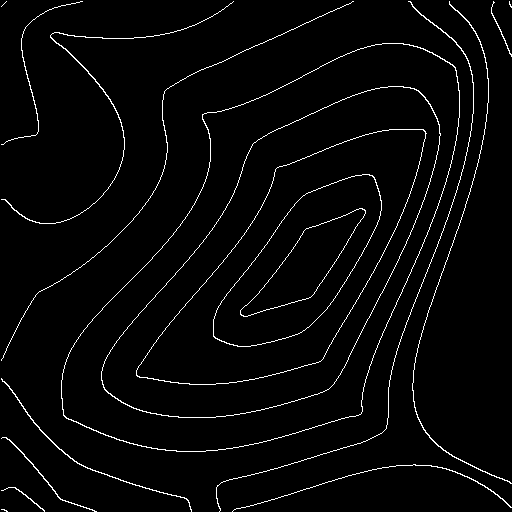

In [24]:
im_py=io.imread('images/pyramide.tif')
alpha = 0.5
contours=laplacien(im_py,alpha)
viewimage(contours)

### 1.5 Changez d’image

alpha = 1, seuil = 0.1


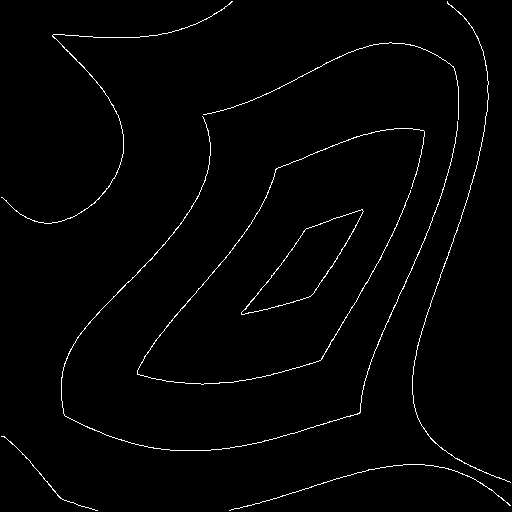

In [25]:
im_pyg=io.imread('images/pyra-gauss.tif')
gfim_pyg=filters.gaussian(im_pyg,sigma)
Svalcontours_pyg = Smooth_deriche(gfim_pyg,alpha = 1,seuilnorme = 0.1)
viewimage(255*Svalcontours_pyg, normalize=True,titre='alpha = 1, seuil = 0.1')

Quel opérateur choisiriez-vous pour segmenter l’image pyra-gauss.tif ?

***On utilise le Filtre récursif de Deriche (smoothed).***

Quels seraient les pré-traitements et les post-traitements à effectuer ?

***- Pré-traitements : filtrage gaussien***

***- Post-traitements : seuillage, maximum du gradient***

## 2 Seuillage avec hystérésis
### 2.1 Application à la détection de lignes
Appliquez le filtre du Chapeau haut de forme (tophat) à une image SPOT pour effectuer une détection de lignes

Modifiez le rayon de l’élément structurant utilisé pour calculer le filtre tophat, et indiquez comment évoluent les lignes détectées.

Modifiez les valeurs des deux seuils, et examinez comment les lignes sont supprimées ou préservées. Quels sont les seuils qui donnent, à votre avis, le meilleur résultat ?


Appliquez le seuillage par hystérésis pour améliorer la d´etection de contours
obtenue avec un des op´erateurs vus pr´ec´edemment sur une image de votre choix.

Précisez la mise en oeuvre que vous proposez et commentez les r´esultats.


In [26]:
from skimage import data, filters
from skimage import io as skio
from scipy import ndimage

# POUR LA MORPHO
import skimage.morphology as morpho  
import skimage.feature as skf
from scipy import ndimage as ndi


def tophat(im,rayon):
    se=morpho.square(rayon)
    ero=morpho.erosion(im,se)
    dil=morpho.dilation(ero,se)
    tophat=im-dil
    return tophat
 
def f_hist(ima,rayon = 3,low = 3,high = 5):
    
    fig, ax = plt.subplots(nrows=2, ncols=3,figsize=(20, 20))
    top=tophat(ima,rayon)

    lowt = (top > low).astype(int)
    hight = (top > high).astype(int)
    hyst = filters.apply_hysteresis_threshold(top, low, high)


    ax[0, 0].imshow(ima, cmap='gray')
    ax[0, 0].set_title('Original image')

    ax[0, 1].imshow(top, cmap='magma')
    ax[0, 1].set_title('Tophat filter')

    ax[1, 0].imshow(lowt, cmap='magma')
    ax[1, 0].set_title('Low threshold')

    ax[1, 1].imshow(hight, cmap='magma')
    ax[1, 1].set_title('High threshold')

    ax[0, 2].imshow(hyst, cmap='magma')
    ax[0, 2].set_title('Hysteresis')

    ax[1, 2].imshow(hight + hyst, cmap='magma')
    ax[1, 2].set_title('High + Hysteresis')

    for a in ax.ravel():
        a.axis('off')

    plt.tight_layout()

    plt.show()
    return

In [27]:
ima = skio.imread('images\spot.tif')

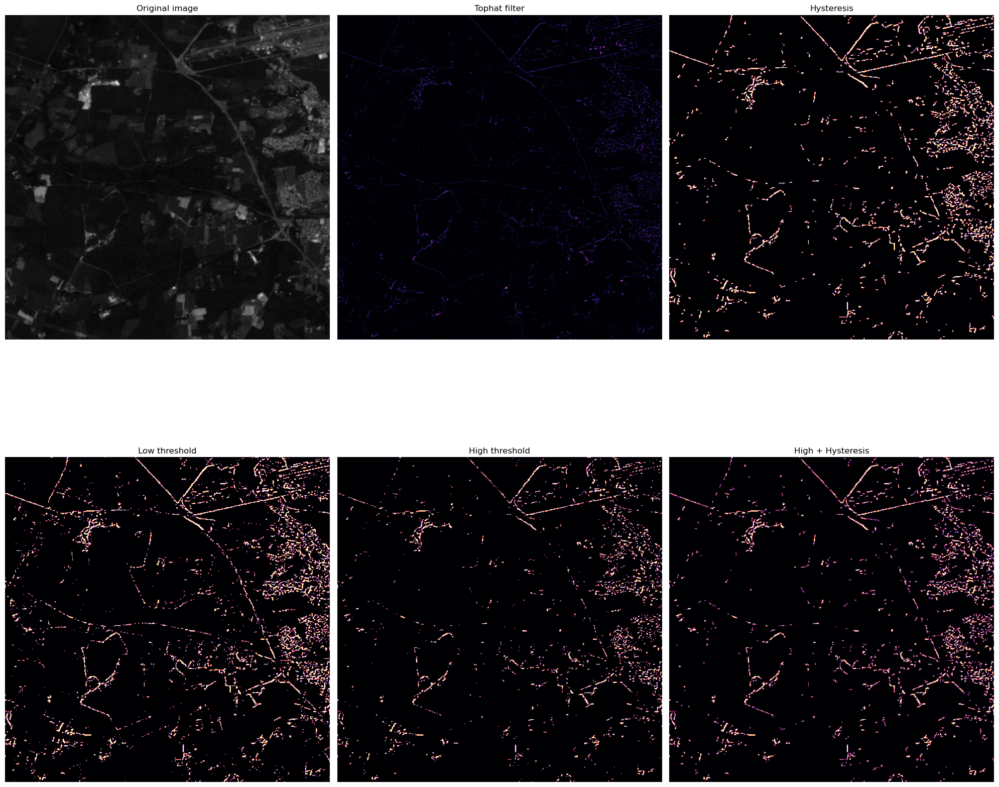

In [28]:
f_hist(ima ,rayon = 3,low = 3,high = 5)

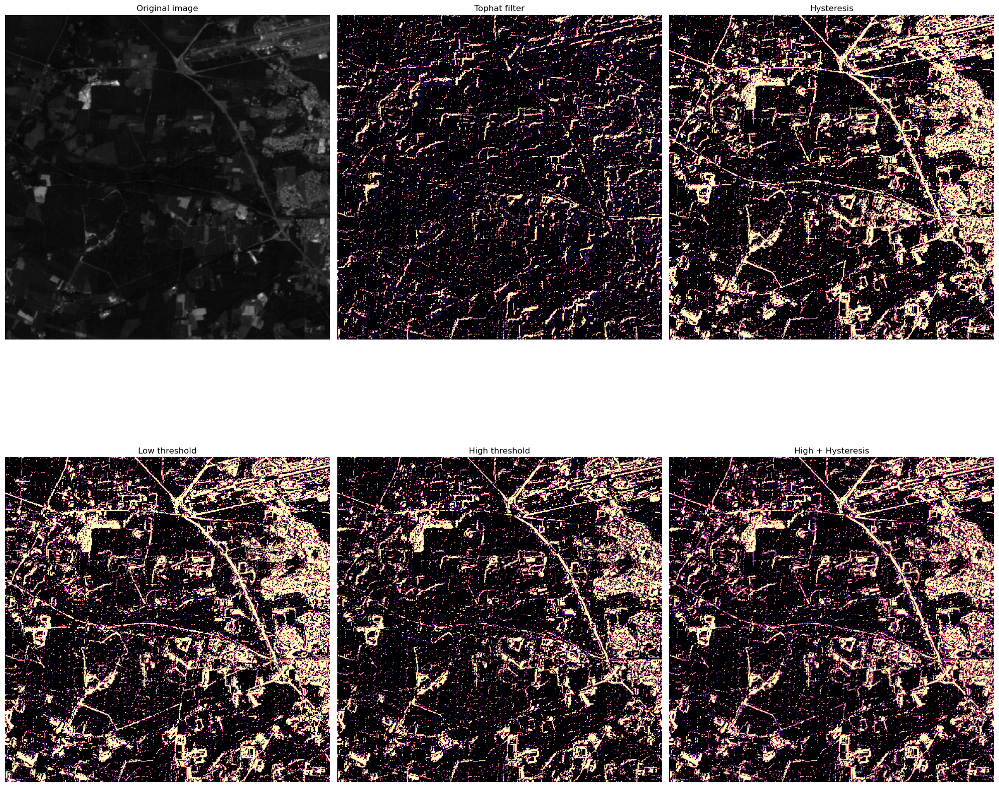

In [29]:
f_hist(ima ,rayon = 6,low = 3,high = 5)

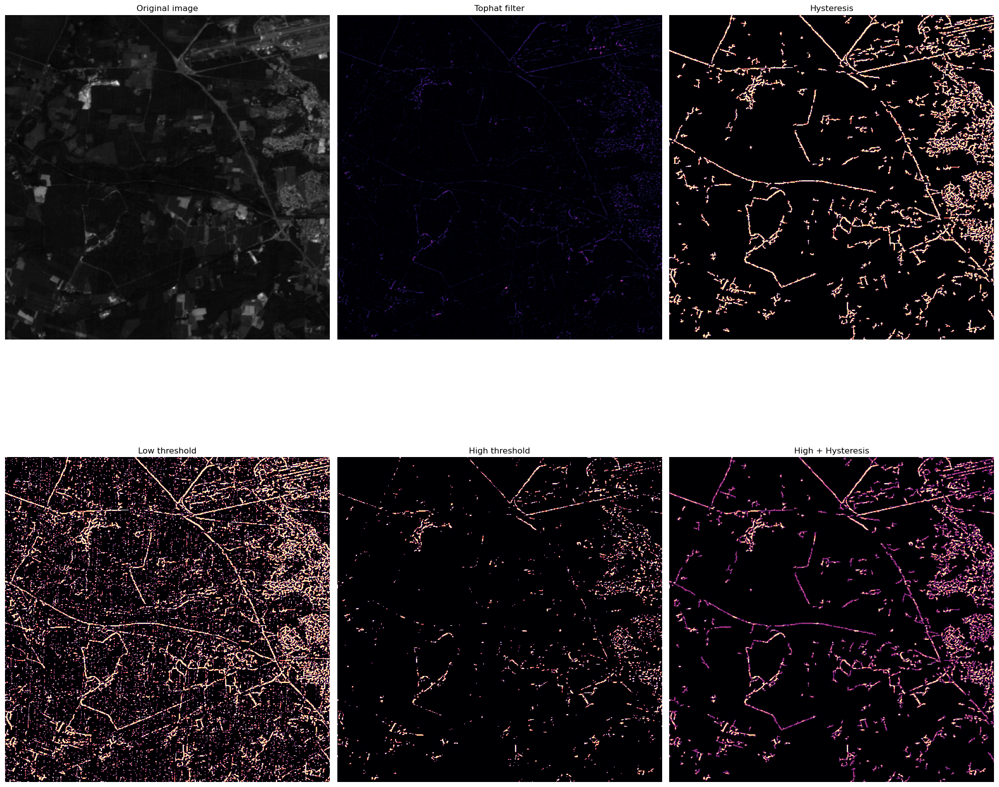

In [30]:
f_hist(ima ,rayon = 3,low = 1,high = 5)

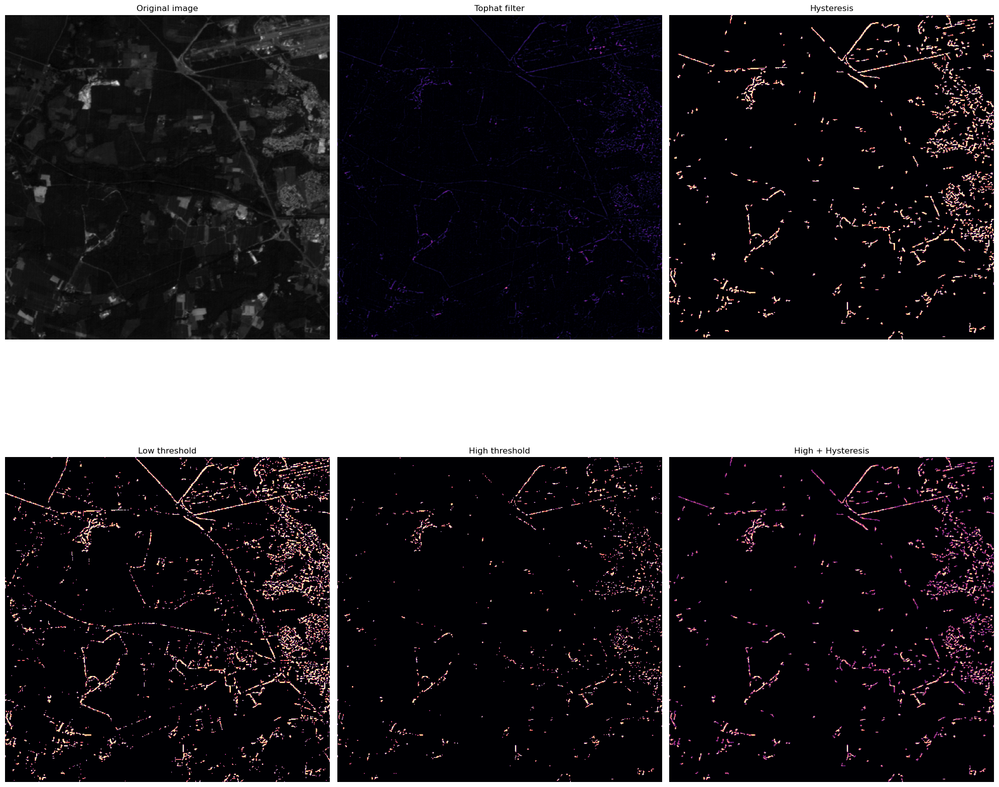

In [31]:
f_hist(ima ,rayon = 3,low = 3,high = 7)

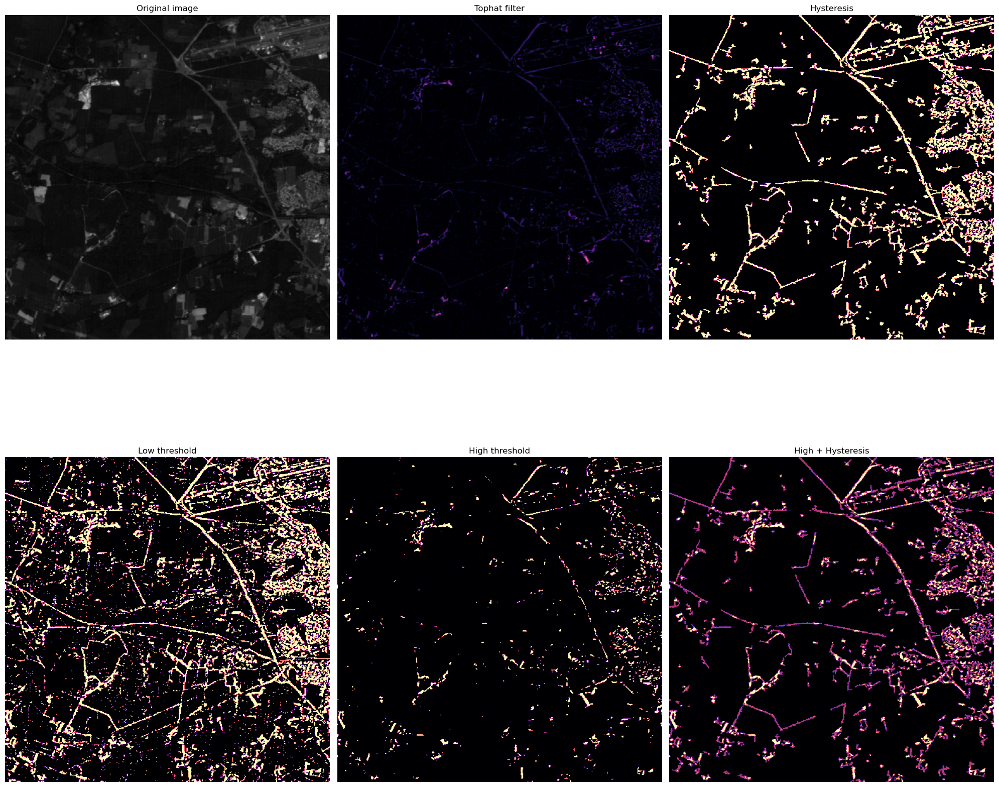

In [32]:
f_hist(ima ,rayon = 5,low =2,high = 9)

## 3 Segmentation par classification : K-moyennes
### 3.1 Image à niveaux de gris

In [33]:
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin
from sklearn.datasets import load_sample_image
from sklearn.utils import shuffle
from time import time

Fitting model on a small sub-sample of the data


C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


done in 0.402s.
Predicting color indices on the full image (k-means)
done in 0.051s.
Image originale


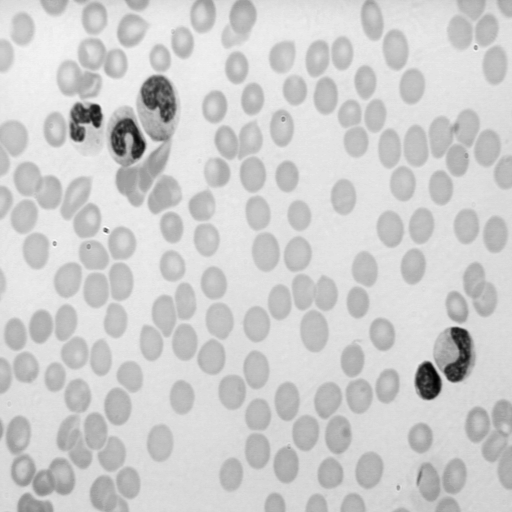

Quantized image with KMeans


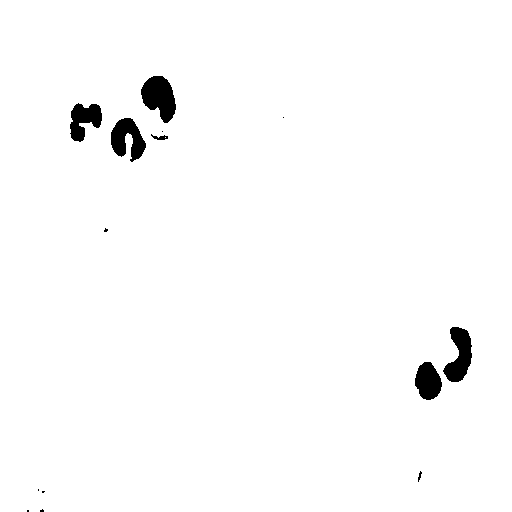

In [34]:
n_class = 2
ima=io.imread('images/cell.tif')
#sigma=0
#gfima=filters.gaussian(ima,sigma)
# Convert to floats instead of the default 8 bits integer coding. Dividing by
# 255 is important so that plt.imshow behaves works well on float data (need to
# be in the range [0-1])
ima = np.array(ima, dtype=np.float64) / 255

# Load Image and transform to a 2D numpy array.
w, h = original_shape = tuple(ima.shape)
d = 1
image_array = np.reshape(ima, (w * h, d))

print("Fitting model on a small sub-sample of the data")
t0 = time()
image_array_sample = shuffle(image_array, random_state=0)[:1000]
kmeans = KMeans(n_clusters=n_class,init = np.array([[0.7],[0.8]]), random_state=0).fit(image_array_sample)
print("done in %0.3fs." % (time() - t0))

# Get labels for all points
print("Predicting color indices on the full image (k-means)")
t0 = time()
labels = kmeans.predict(image_array)
print("done in %0.3fs." % (time() - t0))

def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    image = np.zeros((w, h))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    return image

# Display all results, alongside original image
viewimage(ima, normalize=True,titre='Image originale')
viewimage(recreate_image(kmeans.cluster_centers_, labels, w, h), normalize=True,titre='Quantized image with KMeans')

In [35]:
!jupyter nbconvert --to webpdf --allow-chromium-download Untitled.ipynb

[NbConvertApp] Converting notebook Untitled.ipynb to webpdf
[NbConvertApp] Building PDF
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 5324785 bytes to Untitled.pdf
